<a href="https://colab.research.google.com/github/novalrnv/PCVK_Ganjil_2026/blob/main/Week-3/Modul03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 30


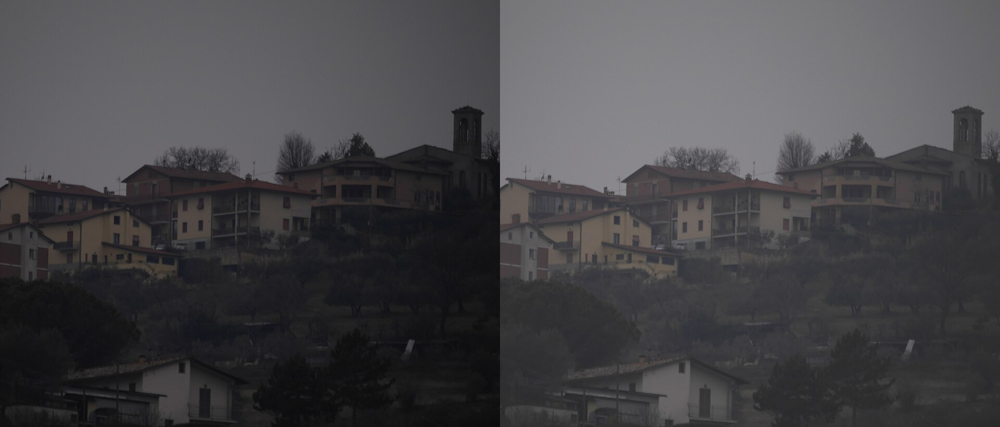

In [3]:
print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

#sesuaikan dengan file dan folder di drive Anda
original = cv.imread('/content/drive/MyDrive/PCVK/Images/houses.jpg')
brightness_image = np.zeros(original.shape, dtype=original.dtype)

#akses per pixel
#np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

## **TUGAS PRAKTIKUM**

###1. Inverse Citra

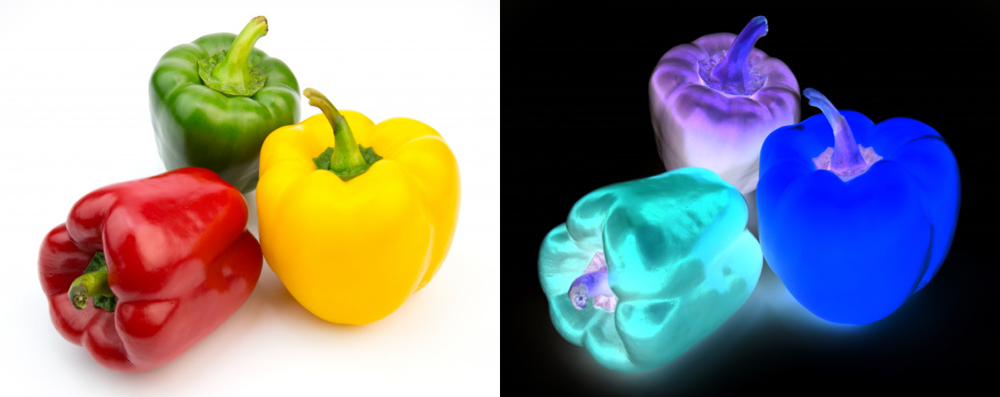

In [4]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/peppers.jpg')

# Membuat citra inverse
inverse = 255 - original

# Menampilkan citra asli dan hasil inverse
final_frame = cv.hconcat((original, inverse))
cv2_imshow(final_frame)

##2. Transfromasi contrast

 Mengubah kontras dan tingkat kecerahaan citra 
-----------------------------------------------
Masukkan tingkat kecerahan: 10
Masukkan kontras: 1.5


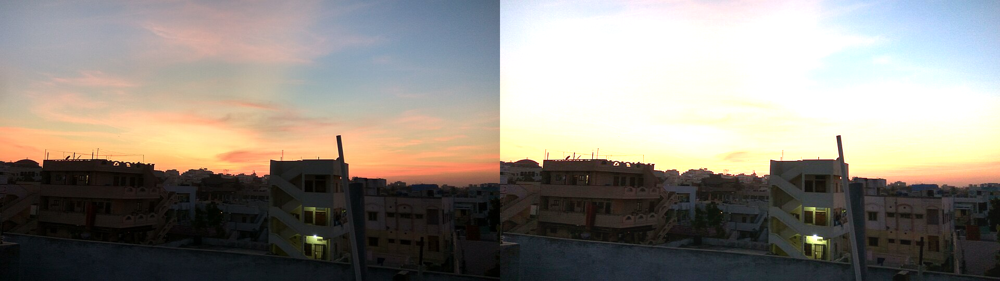

In [9]:
print(' Mengubah kontras dan tingkat kecerahaan citra ')
print('-----------------------------------------------')

try:
    brightness = int(input('Masukkan tingkat kecerahan: '))
    contrast = float(input('Masukkan kontras: '))
except ValueError:
    print('Error, not a number')

# Membaca citra
original = cv.imread('/content/drive/MyDrive/PCVK/Images/sunset.jpg')

# Transformasi contrast dan brightness
contrast_image = cv.convertScaleAbs(
    original,
    alpha=contrast,
    beta=brightness
)

# Menggabungkan citra asli dan hasil
final_frame = cv.hconcat((original, contrast_image))

# Menampilkan hasil
cv2_imshow(final_frame)

##3. Transformasi logarithmic brightness

 Mengubah tingkat kecerahan citra dengan Transformasi Log 
--------------------------------------------------------
Masukkan nilai kecerahan: 50


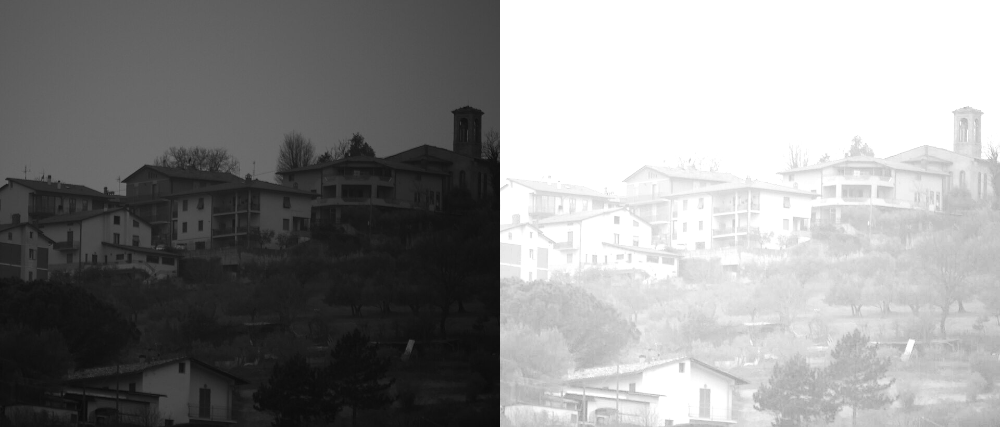

In [10]:
print(' Mengubah tingkat kecerahan citra dengan Transformasi Log ')
print('--------------------------------------------------------')

try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

# Membaca citra
original = cv.imread('/content/drive/MyDrive/PCVK/Images/houses.jpg')

# Mengubah citra menjadi grayscale
original_gray = cv.cvtColor(original, cv.COLOR_BGR2GRAY)

# Konstanta transformasi log
c = 255 / np.log(1 + brightness)

# Transformasi logarithmic brightness
log_image = c * np.log(1 + original_gray)

# Membatasi nilai pixel 0-255
log_image = np.clip(log_image, 0, 255).astype(np.uint8)

# Menggabungkan citra asli dan hasil
final_frame = cv.hconcat((original_gray, log_image))

# Menampilkan hasil
cv2_imshow(final_frame)

##4. Transformasi grayscale

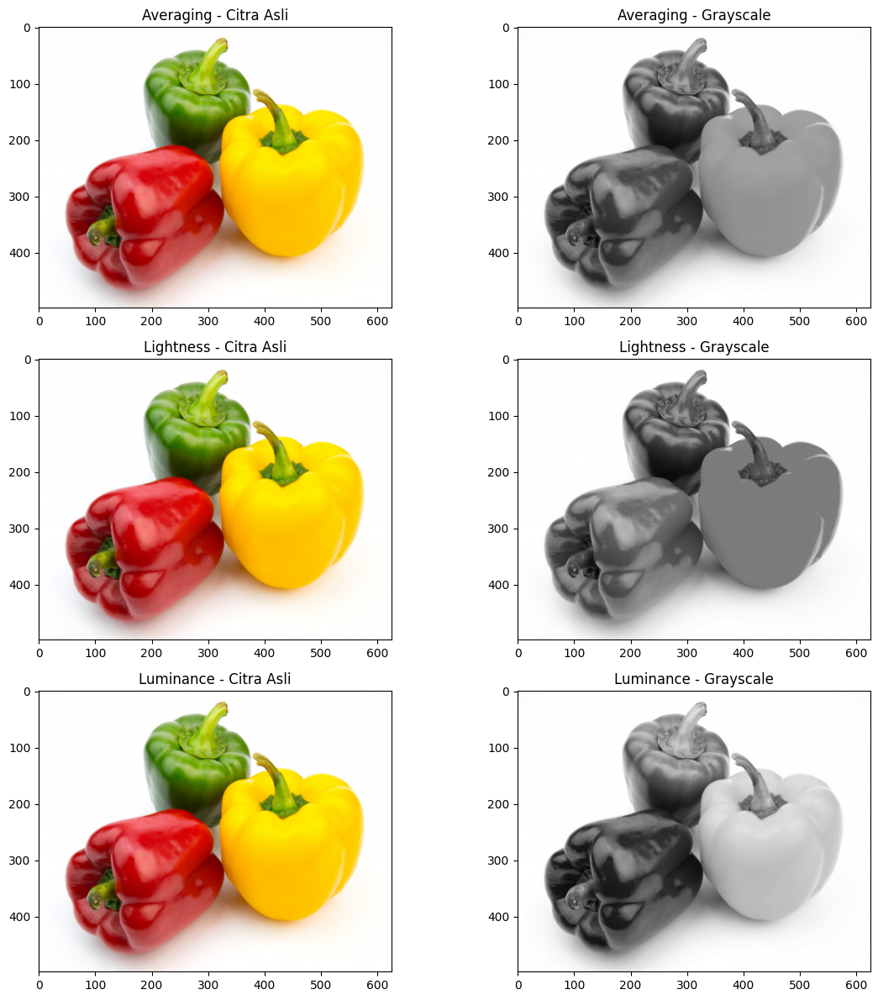

In [15]:
# Membaca citra
original = cv.imread('/content/drive/MyDrive/PCVK/Images/peppers.jpg')

# Mengubah BGR menjadi RGB
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Mengubah channel menjadi float
R = img_rgb[:, :, 0].astype(np.float32)
G = img_rgb[:, :, 1].astype(np.float32)
B = img_rgb[:, :, 2].astype(np.float32)

# A. Averaging
gray_averaging = (R + G + B) / 3
gray_averaging = gray_averaging.astype(np.uint8)

# B. Lightness
gray_lightness = (np.maximum(np.maximum(R, G), B) +
                  np.minimum(np.minimum(R, G), B)) / 2
gray_lightness = gray_lightness.astype(np.uint8)

# C. Luminance
gray_luminance = (0.21 * R + 0.72 * G + 0.07 * B)
gray_luminance = gray_luminance.astype(np.uint8)


# Menampilkan hasil
plt.figure(figsize=(12, 12))

# Averaging
plt.subplot(3, 2, 1)
plt.imshow(img_rgb)
plt.title('Averaging - Citra Asli')

plt.subplot(3, 2, 2)
plt.imshow(gray_averaging, cmap='gray')
plt.title('Averaging - Grayscale')

# Lightness
plt.subplot(3, 2, 3)
plt.imshow(img_rgb)
plt.title('Lightness - Citra Asli')

plt.subplot(3, 2, 4)
plt.imshow(gray_lightness, cmap='gray')
plt.title('Lightness - Grayscale')

# Luminance
plt.subplot(3, 2, 5)
plt.imshow(img_rgb)
plt.title('Luminance - Citra Asli')

plt.subplot(3, 2, 6)
plt.imshow(gray_luminance, cmap='gray')
plt.title('Luminance - Grayscale')

plt.tight_layout()
plt.show()

##5. Tampilkan warna tertentu pada citra

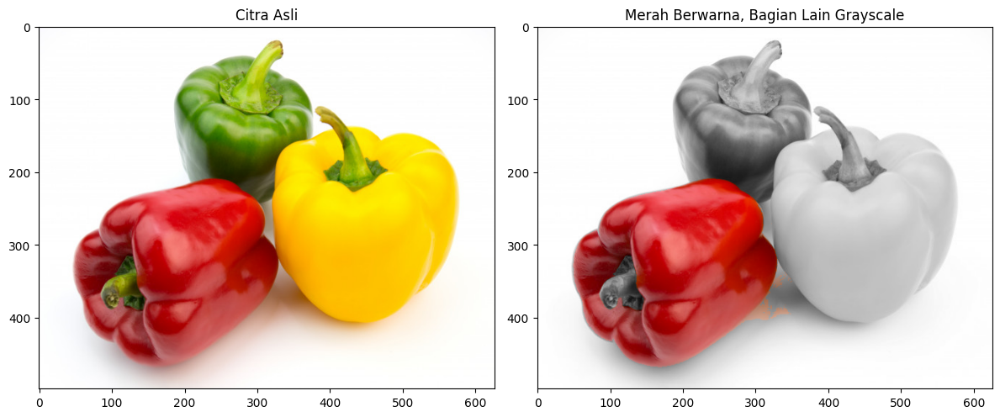

In [17]:
# Membaca citra
original = cv.imread('/content/drive/MyDrive/PCVK/Images/peppers.jpg')

# Mengubah BGR menjadi RGB
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Mengubah RGB ke HSV
img_hsv = cv.cvtColor(img_rgb, cv.COLOR_RGB2HSV)

# Membuat grayscale dengan metode Luminance
img_float = img_rgb.astype(np.float32)

R = img_float[:, :, 0]
G = img_float[:, :, 1]
B = img_float[:, :, 2]

gray = 0.21 * R + 0.72 * G + 0.07 * B
gray = gray.astype(np.uint8)

# Mask warna merah
mask_red1 = cv.inRange(
    img_hsv,
    np.array([0, 80, 50]),
    np.array([10, 255, 255])
)

mask_red2 = cv.inRange(
    img_hsv,
    np.array([170, 80, 50]),
    np.array([180, 255, 255])
)

mask_red = mask_red1 | mask_red2

# Membuat gambar grayscale
result = np.stack((gray, gray, gray), axis=2)

# Mengembalikan warna merah
result[mask_red > 0] = img_rgb[mask_red > 0]

# Menampilkan hasil
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Citra Asli')
plt.axis('on')

plt.subplot(1, 2, 2)
plt.imshow(result)
plt.title('Merah Berwarna, Bagian Lain Grayscale')
plt.axis('on')

plt.tight_layout()
plt.show()

##6. Buat Gamma Correction

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 0.5


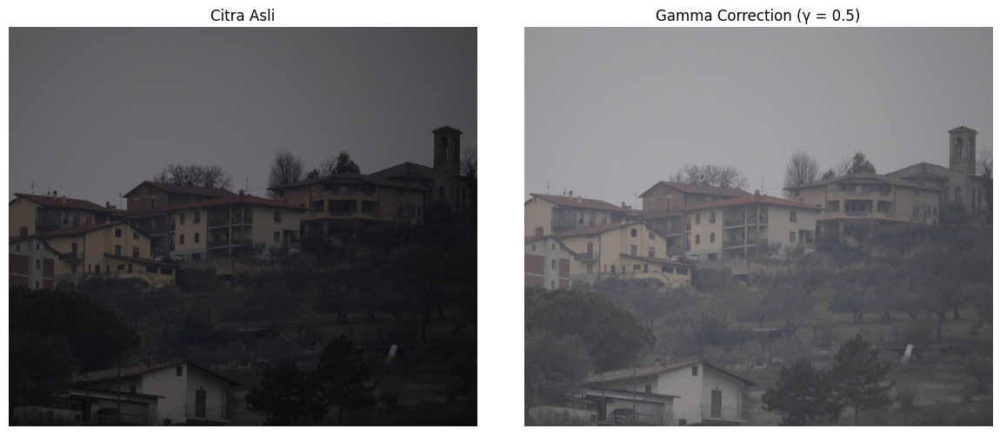

In [20]:
print(' Gamma Correction pada citra ')
print('----------------------------------')

try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

# Membaca citra
original = cv.imread('/content/drive/MyDrive/PCVK/Images/houses.jpg')

# Gamma correction
img_float = original.astype(np.float32) / 255.0
gamma_image = np.power(img_float, gamma)
gamma_image = np.uint8(gamma_image * 255)

# Mengubah BGR menjadi RGB untuk matplotlib
original_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
gamma_rgb = cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB)

# Menampilkan citra
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gamma_rgb)
plt.title(f'Gamma Correction (γ = {gamma})')
plt.axis('off')

plt.tight_layout()
plt.show()

##7. Buat Simulasi Image Depth

 Simulasi Image Depth 
----------------------------------
Masukkan bit depth tujuan (1-8): 3
Bit depth awal  : 8 bit
Bit depth tujuan: 3 bit
Jumlah level    : 8


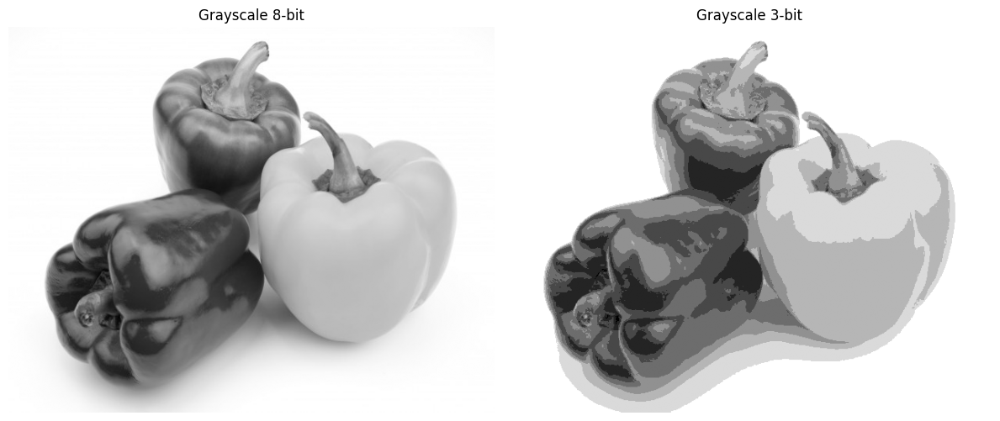

In [21]:
print(' Simulasi Image Depth ')
print('----------------------------------')

try:
    bit_depth = int(input('Masukkan bit depth tujuan (1-8): '))
except ValueError:
    print('Error, not a number')

# Bit depth awal
bit_depth_awal = 8

# Jumlah level warna
jumlah_level = pow(2, bit_depth)

# Jarak antar level
level = 255 / (jumlah_level - 1)

# Membaca citra grayscale
original = cv.imread(
    '/content/drive/MyDrive/PCVK/Images/peppers.jpg',
    cv.IMREAD_GRAYSCALE
)

# Membuat citra hasil
depth_image = np.zeros(original.shape, original.dtype)

# Proses kuantisasi
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        depth_image[y, x] = round(original[y, x] / level) * level

# Menampilkan informasi
print('Bit depth awal  :', bit_depth_awal, 'bit')
print('Bit depth tujuan:', bit_depth, 'bit')
print('Jumlah level    :', jumlah_level)

# Menampilkan citra
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(original, cmap='gray')
plt.title('Grayscale 8-bit')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(depth_image, cmap='gray')
plt.title(f'Grayscale {bit_depth}-bit')
plt.axis('off')

plt.tight_layout()
plt.show()

##8. Buat Modul Avarage Denoising

In [25]:
import glob

# Membaca citra asli
original = cv.imread(
    '/content/drive/MyDrive/PCVK/Images/galaxy.jpg'
)

# Membaca semua citra yang memiliki Gaussian Noise
cv_img = []

for img in glob.glob(
    '/content/drive/MyDrive/PCVK/Images/noises/*.jpg'
):
    n = cv.imread(img)
    cv_img.append(n)

print('Jumlah citra noise:', len(cv_img))

Jumlah citra noise: 100


Jumlah citra: 10
PSNR: 19.73 dB

Jumlah citra: 20
PSNR: 19.83 dB

Jumlah citra: 40
PSNR: 19.89 dB

Jumlah citra: 80
PSNR: 19.92 dB

Jumlah citra: 100
PSNR: 19.92 dB



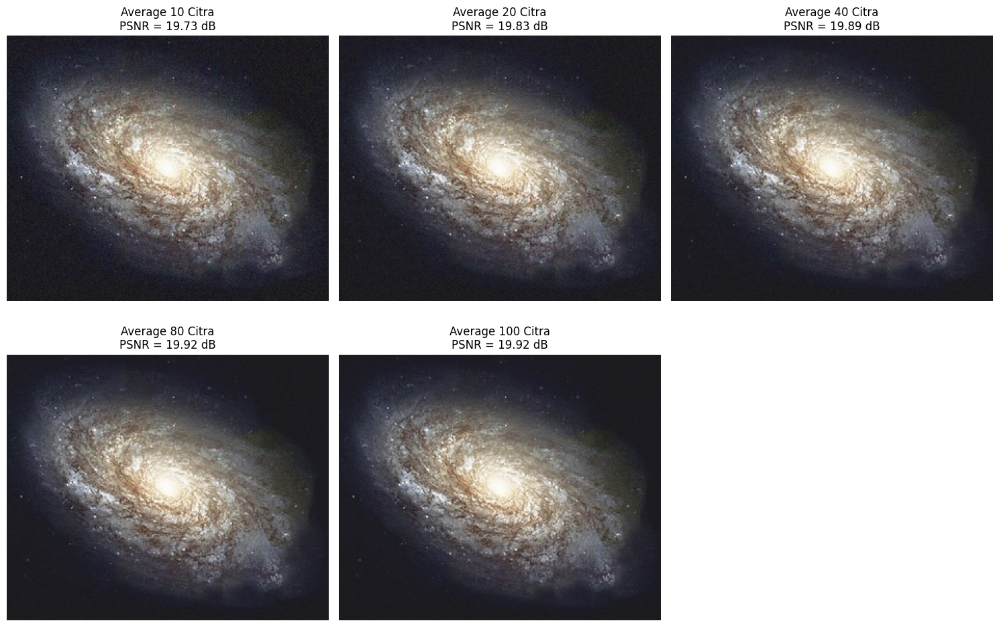

In [27]:
# Jumlah citra yang akan dirata-rata
jumlah_average = [10, 20, 40, 80, 100]

hasil_denoising = []
nilai_psnr = []

plt.figure(figsize=(15, 10))

for i, jumlah in enumerate(jumlah_average):

    # Mengubah citra menjadi float agar perhitungan rata-rata aman
    images = np.array(cv_img[:jumlah], dtype=np.float32)

    # Average Denoising
    average_image = np.mean(images, axis=0)

    # Kembalikan ke uint8
    average_image = np.clip(
        average_image, 0, 255
    ).astype(np.uint8)

    hasil_denoising.append(average_image)

    # Menghitung PSNR terhadap citra asli
    psnr = cv.PSNR(original, average_image)
    nilai_psnr.append(psnr)

    print(f'Jumlah citra: {jumlah}')
    print(f'PSNR: {psnr:.2f} dB')
    print()

    # Menampilkan citra hasil
    plt.subplot(2, 3, i + 1)

    # BGR ke RGB agar warna tampil benar
    img_rgb = cv.cvtColor(
        average_image,
        cv.COLOR_BGR2RGB
    )

    plt.imshow(img_rgb)
    plt.title(f'Average {jumlah} Citra\nPSNR = {psnr:.2f} dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

##9. Buat Image Masking

A. NOT(komplemen)




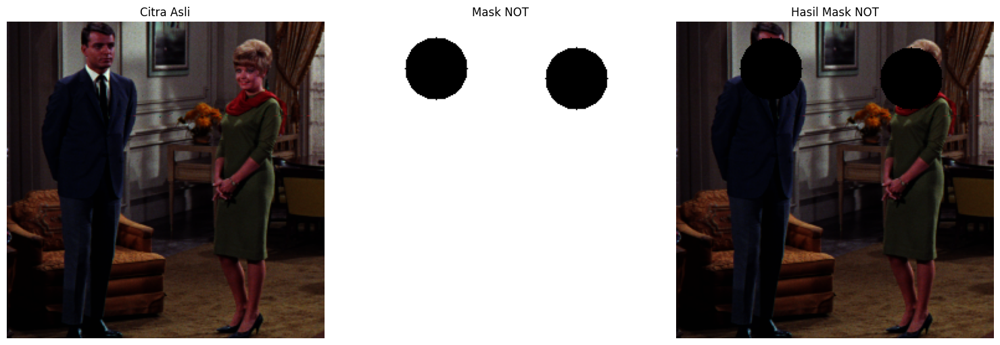

In [41]:
# Membaca citra
original = cv.imread(
    '/content/drive/MyDrive/PCVK/Images/couple.tiff'
)

# Membuat citra RGB
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Ukuran citra
tinggi, lebar = original.shape[:2]

# Membuat mask
mask = np.zeros((tinggi, lebar), dtype=np.uint8)

# Ukuran lingkaran
radius = int(min(tinggi, lebar) * 0.10)

# Posisi lingkaran pada kepala
center1 = (int(lebar * 0.30), int(tinggi * 0.15))
center2 = (int(lebar * 0.74), int(tinggi * 0.18))

# Membuat dua lingkaran putih
cv.circle(mask, center1, radius, 255, -1)
cv.circle(mask, center2, radius, 255, -1)

# Operasi NOT
mask_not = cv.bitwise_not(mask)

# Menerapkan mask NOT
hasil_not = cv.bitwise_and(
    original,
    original,
    mask=mask_not
)

# Mengubah hasil ke RGB
hasil_not_rgb = cv.cvtColor(
    hasil_not,
    cv.COLOR_BGR2RGB
)

# Menampilkan
plt.figure(figsize=(15, 5))

# Citra asli
plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title('Citra Asli')
plt.axis('off')

# Mask NOT
plt.subplot(1, 3, 2)
plt.imshow(mask_not, cmap='gray')
plt.title('Mask NOT')
plt.axis('off')

# Hasil
plt.subplot(1, 3, 3)
plt.imshow(hasil_not_rgb)
plt.title('Hasil Mask NOT')
plt.axis('off')

plt.tight_layout()
plt.show()

B. OR (Atau)

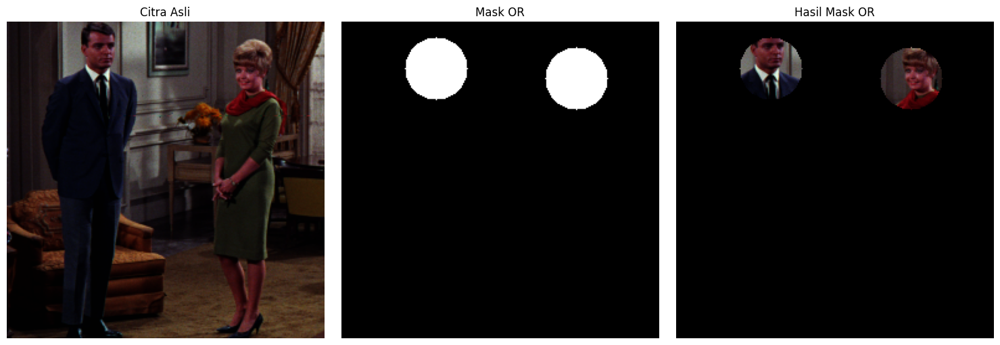

In [40]:
# Membaca citra
original = cv.imread(
    '/content/drive/MyDrive/PCVK/Images/couple.tiff'
)

# Mengubah BGR ke RGB
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Ukuran citra
tinggi, lebar = original.shape[:2]

# Membuat dua mask
mask1 = np.zeros((tinggi, lebar), dtype=np.uint8)
mask2 = np.zeros((tinggi, lebar), dtype=np.uint8)

# Ukuran lingkaran
radius = int(min(tinggi, lebar) * 0.10)

# Posisi kepala
center1 = (int(lebar * 0.30), int(tinggi * 0.15))
center2 = (int(lebar * 0.74), int(tinggi * 0.18))

# Membuat dua lingkaran
cv.circle(mask1, center1, radius, 255, -1)
cv.circle(mask2, center2, radius, 255, -1)

# Operasi OR
mask_or = cv.bitwise_or(mask1, mask2)

# Menerapkan mask OR
hasil_or = cv.bitwise_and(
    original,
    original,
    mask=mask_or
)

# RGB
hasil_or_rgb = cv.cvtColor(
    hasil_or,
    cv.COLOR_BGR2RGB
)

# Menampilkan
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(mask_or, cmap='gray')
plt.title('Mask OR')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(hasil_or_rgb)
plt.title('Hasil Mask OR')
plt.axis('off')

plt.tight_layout()
plt.show()

C. AND (Dan)

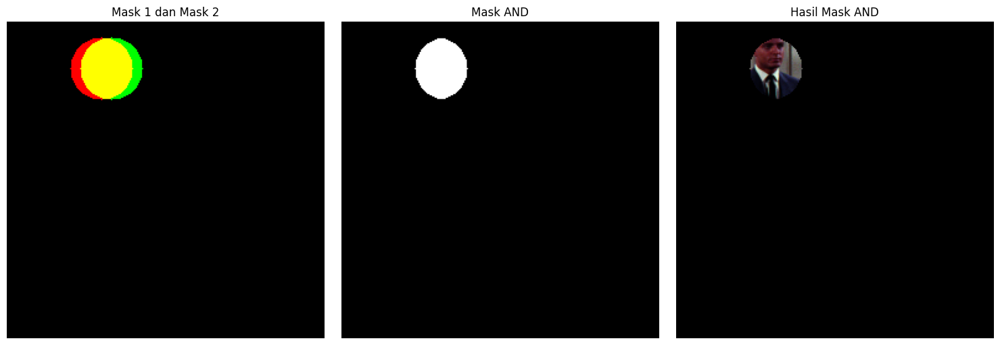

In [44]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/couple.tiff')
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

tinggi, lebar = original.shape[:2]


mask1 = np.zeros((tinggi, lebar), dtype=np.uint8)

radius = int(min(tinggi, lebar) * 0.10)

center1 = (int(lebar * 0.30), int(tinggi * 0.15))

cv.circle(mask1, center1, radius, 255, -1)


mask2 = np.zeros((tinggi, lebar), dtype=np.uint8)

center2 = (center1[0] + 8, center1[1])

cv.circle(mask2, center2, radius, 255, -1)

mask_and = cv.bitwise_and(mask1, mask2)

hasil_and = cv.bitwise_and(
    original,
    original,
    mask=mask_and
)

hasil_and_rgb = cv.cvtColor(hasil_and, cv.COLOR_BGR2RGB)


plt.figure(figsize=(15, 5))

# Dua lingkaran penuh
plt.subplot(1, 3, 1)

mask_tumpuk = np.zeros((tinggi, lebar, 3), dtype=np.uint8)

mask_tumpuk[mask1 > 0] = [255, 0, 0]
mask_tumpuk[mask2 > 0] = [0, 255, 0]

# Bagian yang bertumpuk
mask_tumpuk[(mask1 > 0) & (mask2 > 0)] = [255, 255, 0]

plt.imshow(mask_tumpuk)
plt.title('Mask 1 dan Mask 2')
plt.axis('off')

# Hasil AND
plt.subplot(1, 3, 2)
plt.imshow(mask_and, cmap='gray')
plt.title('Mask AND')
plt.axis('off')

# Hasil gambar
plt.subplot(1, 3, 3)
plt.imshow(hasil_and_rgb)
plt.title('Hasil Mask AND')
plt.axis('off')

plt.tight_layout()
plt.show()

D. NAND (Not And)

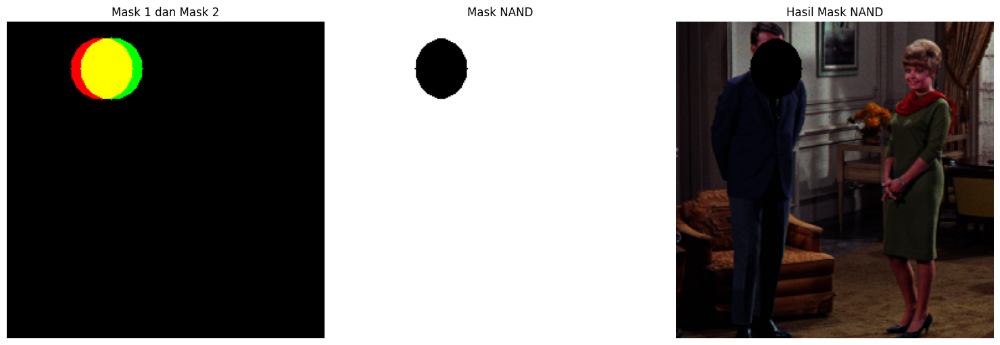

In [46]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/couple.tiff')
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

tinggi, lebar = original.shape[:2]


mask1 = np.zeros((tinggi, lebar), dtype=np.uint8)

radius = int(min(tinggi, lebar) * 0.10)

center1 = (int(lebar * 0.30), int(tinggi * 0.15))

cv.circle(mask1, center1, radius, 255, -1)



mask2 = np.zeros((tinggi, lebar), dtype=np.uint8)

center2 = (center1[0] + 8, center1[1])

cv.circle(mask2, center2, radius, 255, -1)



mask_and = cv.bitwise_and(mask1, mask2)



mask_nand = cv.bitwise_not(mask_and)

hasil_nand = cv.bitwise_and(
    original,
    original,
    mask=mask_nand
)

hasil_nand_rgb = cv.cvtColor(hasil_nand, cv.COLOR_BGR2RGB)



plt.figure(figsize=(15, 5))

# Dua lingkaran
plt.subplot(1, 3, 1)

mask_tumpuk = np.zeros((tinggi, lebar, 3), dtype=np.uint8)

mask_tumpuk[mask1 > 0] = [255, 0, 0]
mask_tumpuk[mask2 > 0] = [0, 255, 0]

# Bagian yang bertumpuk
mask_tumpuk[(mask1 > 0) & (mask2 > 0)] = [255, 255, 0]

plt.imshow(mask_tumpuk)
plt.title('Mask 1 dan Mask 2')
plt.axis('off')


# Mask NAND
plt.subplot(1, 3, 2)
plt.imshow(mask_nand, cmap='gray')
plt.title('Mask NAND')
plt.axis('off')


# Hasil NAND
plt.subplot(1, 3, 3)
plt.imshow(hasil_nand_rgb)
plt.title('Hasil Mask NAND')
plt.axis('off')

plt.tight_layout()
plt.show()

E. XOR (Exclusive Or)

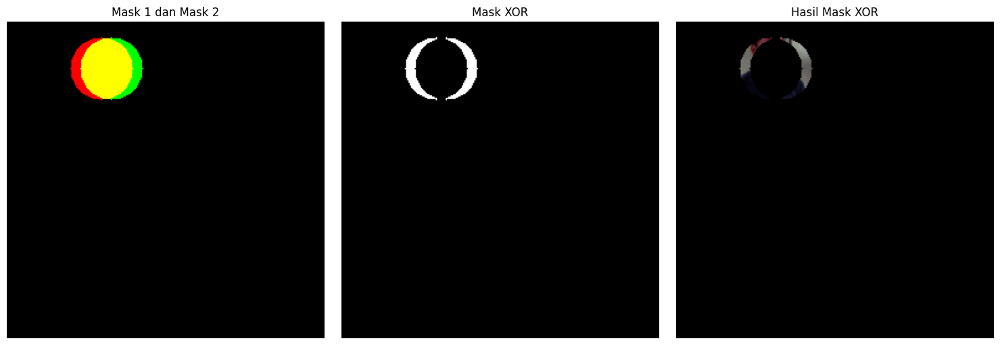

In [47]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/couple.tiff')
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

tinggi, lebar = original.shape[:2]


mask1 = np.zeros((tinggi, lebar), dtype=np.uint8)

radius = int(min(tinggi, lebar) * 0.10)

center1 = (int(lebar * 0.30), int(tinggi * 0.15))

cv.circle(mask1, center1, radius, 255, -1)



mask2 = np.zeros((tinggi, lebar), dtype=np.uint8)

center2 = (center1[0] + 8, center1[1])

cv.circle(mask2, center2, radius, 255, -1)



mask_xor = cv.bitwise_xor(mask1, mask2)

hasil_xor = cv.bitwise_and(
    original,
    original,
    mask=mask_xor
)

hasil_xor_rgb = cv.cvtColor(hasil_xor, cv.COLOR_BGR2RGB)


plt.figure(figsize=(15, 5))

# Dua lingkaran penuh
plt.subplot(1, 3, 1)

mask_tumpuk = np.zeros((tinggi, lebar, 3), dtype=np.uint8)

mask_tumpuk[mask1 > 0] = [255, 0, 0]
mask_tumpuk[mask2 > 0] = [0, 255, 0]

# Bagian yang bertumpuk
mask_tumpuk[(mask1 > 0) & (mask2 > 0)] = [255, 255, 0]

plt.imshow(mask_tumpuk)
plt.title('Mask 1 dan Mask 2')
plt.axis('off')


# Mask XOR
plt.subplot(1, 3, 2)
plt.imshow(mask_xor, cmap='gray')
plt.title('Mask XOR')
plt.axis('off')


# Hasil XOR
plt.subplot(1, 3, 3)
plt.imshow(hasil_xor_rgb)
plt.title('Hasil Mask XOR')
plt.axis('off')

plt.tight_layout()
plt.show()

##10. Foto Malam Hari

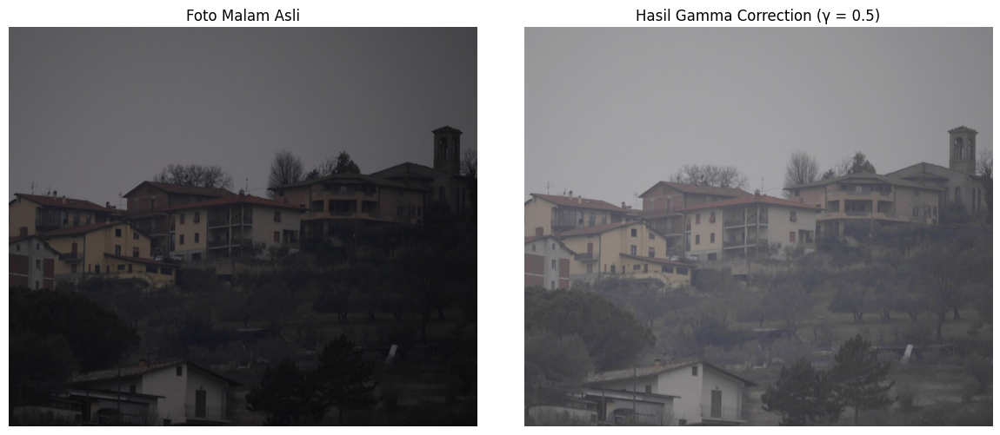

In [48]:
# Membaca citra
original = cv.imread('/content/drive/MyDrive/PCVK/Images/houses.jpg')

# Konversi ke RGB
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Nilai gamma
gamma = 0.5

# Normalisasi citra
img_float = original.astype(np.float32) / 255.0

# Gamma Correction
gamma_image = np.power(img_float, gamma)

# Kembalikan ke 0-255
gamma_image = np.uint8(gamma_image * 255)

# Konversi hasil ke RGB
gamma_rgb = cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB)

# Menampilkan hasil
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Foto Malam Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gamma_rgb)
plt.title('Hasil Gamma Correction (γ = 0.5)')
plt.axis('off')

plt.tight_layout()
plt.show()

##11. Buka gambar cryfish.jpg pada folder images

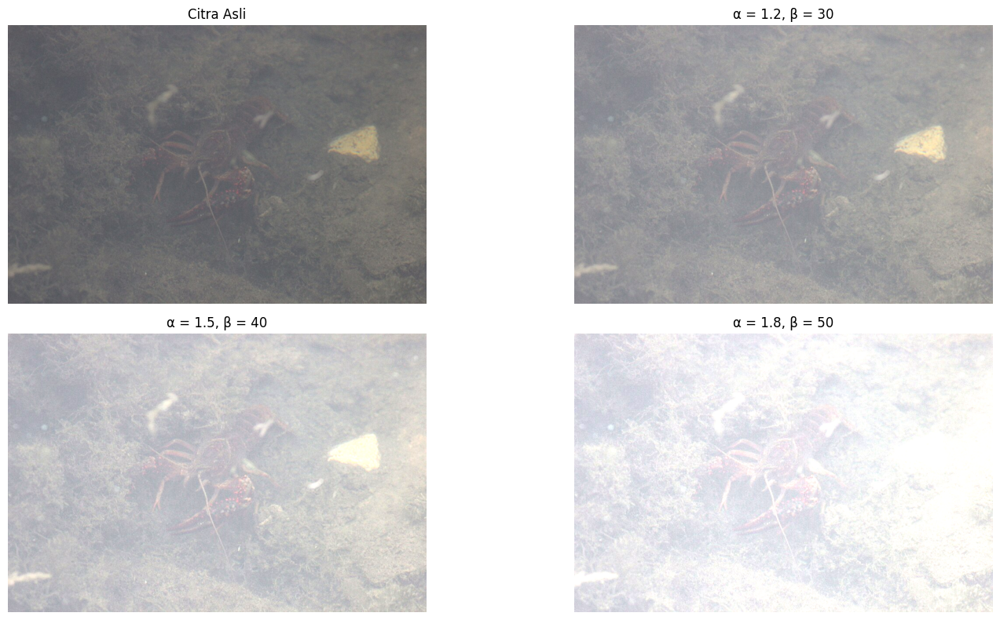

In [49]:
# Membaca gambar
original = cv.imread('/content/drive/MyDrive/PCVK/Images/crayfish.jpg')

# Konversi BGR ke RGB
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)


# Parameter brightness dan contrast
parameter = [
    (1.2, 30),
    (1.5, 40),
    (1.8, 50)
]

hasil = []

for alpha, beta in parameter:
    # Brightness + Contrast
    enhanced = cv.convertScaleAbs(
        original,
        alpha=alpha,
        beta=beta
    )

    hasil.append(enhanced)


plt.figure(figsize=(16, 8))

# Citra asli
plt.subplot(2, 2, 1)
plt.imshow(img_rgb)
plt.title('Citra Asli')
plt.axis('off')

# Parameter 1
plt.subplot(2, 2, 2)
plt.imshow(cv.cvtColor(hasil[0], cv.COLOR_BGR2RGB))
plt.title('α = 1.2, β = 30')
plt.axis('off')

# Parameter 2
plt.subplot(2, 2, 3)
plt.imshow(cv.cvtColor(hasil[1], cv.COLOR_BGR2RGB))
plt.title('α = 1.5, β = 40')
plt.axis('off')

# Parameter 3
plt.subplot(2, 2, 4)
plt.imshow(cv.cvtColor(hasil[2], cv.COLOR_BGR2RGB))
plt.title('α = 1.8, β = 50')
plt.axis('off')

plt.tight_layout()
plt.show()

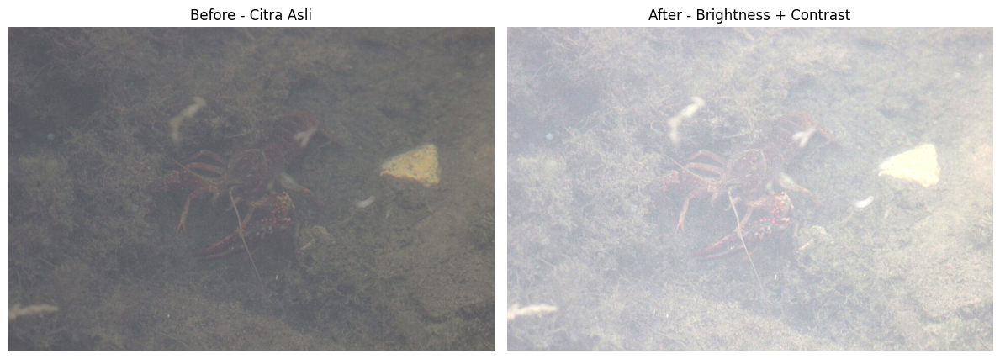

In [50]:
# Parameter terbaik
alpha = 1.5
beta = 40

# Perbaikan citra
enhanced = cv.convertScaleAbs(
    original,
    alpha=alpha,
    beta=beta
)

# Konversi ke RGB
enhanced_rgb = cv.cvtColor(enhanced, cv.COLOR_BGR2RGB)

# Before - After
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Before - Citra Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(enhanced_rgb)
plt.title('After - Brightness + Contrast')
plt.axis('off')

plt.tight_layout()
plt.show()